# 1. Understanding Data

In [ ]:
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')

import missingno as msno
import seaborn as sns
import matplotlib.pyplot as plt




In [ ]:
df = pd.read_csv('data/Train.csv')
df_Test = pd.read_csv('data/Train.csv')

In [ ]:
df.head()

,Place_ID X Date,Date,Place_ID,target,target_min,target_max,target_variance,target_count,precipitable_water_entire_atmosphere,relative_humidity_2m_above_ground,...,L3_SO2_sensor_zenith_angle,L3_SO2_solar_azimuth_angle,L3_SO2_solar_zenith_angle,L3_CH4_CH4_column_volume_mixing_ratio_dry_air,L3_CH4_aerosol_height,L3_CH4_aerosol_optical_depth,L3_CH4_sensor_azimuth_angle,L3_CH4_sensor_zenith_angle,L3_CH4_solar_azimuth_angle,L3_CH4_solar_zenith_angle
0,010Q650 X 2020-01-02,2020-01-02,010Q650,38.0,23.0,53.0,769.50,92,11.000000,60.200001,...,38.593017,-61.752587,22.363665,1793.793579,3227.855469,0.010579,74.481049,37.501499,-62.142639,22.545118
1,010Q650 X 2020-01-03,2020-01-03,010Q650,39.0,25.0,63.0,1319.85,91,14.600000,48.799999,...,59.624912,-67.693509,28.614804,1789.960449,3384.226562,0.015104,75.630043,55.657486,-53.868134,19.293652
2,010Q650 X 2020-01-04,2020-01-04,010Q650,24.0,8.0,56.0,1181.96,96,16.400000,33.400002,...,49.839714,-78.342701,34.296977,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,010Q650 X 2020-01-05,2020-01-05,010Q650,49.0,10.0,55.0,1113.67,96,6.911948,21.300001,...,29.181258,-73.896588,30.545446,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,010Q650 X 2020-01-06,2020-01-06,010Q650,21.0,9.0,52.0,1164.82,95,13.900001,44.700001,...,0.797294,-68.612480,26.899694,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df.shape

(30557, 82)

In [ ]:
df.nunique()

Place_ID X Date                 30557
Date                               94
Place_ID                          340
target                            375
target_min                        269
                                ...  
L3_CH4_aerosol_optical_depth     2874
L3_CH4_sensor_azimuth_angle      2874
L3_CH4_sensor_zenith_angle       2874
L3_CH4_solar_azimuth_angle       2874
L3_CH4_solar_zenith_angle        2874
Length: 82, dtype: int64

In [ ]:
df.columns.unique()


Index(['Place_ID X Date', 'Date', 'Place_ID', 'target', 'target_min',
       'target_max', 'target_variance', 'target_count',
       'precipitable_water_entire_atmosphere',
       'relative_humidity_2m_above_ground',
       'specific_humidity_2m_above_ground', 'temperature_2m_above_ground',
       'u_component_of_wind_10m_above_ground',
       'v_component_of_wind_10m_above_ground',
       'L3_NO2_NO2_column_number_density',
       'L3_NO2_NO2_slant_column_number_density',
       'L3_NO2_absorbing_aerosol_index', 'L3_NO2_cloud_fraction',
       'L3_NO2_sensor_altitude', 'L3_NO2_sensor_azimuth_angle',
       'L3_NO2_sensor_zenith_angle', 'L3_NO2_solar_azimuth_angle',
       'L3_NO2_solar_zenith_angle',
       'L3_NO2_stratospheric_NO2_column_number_density',
       'L3_NO2_tropopause_pressure',
       'L3_NO2_tropospheric_NO2_column_number_density',
       'L3_O3_O3_column_number_density', 'L3_O3_O3_effective_temperature',
       'L3_O3_cloud_fraction', 'L3_O3_sensor_azimuth_angle',
   

In [ ]:
list(df.columns)

['Place_ID X Date',
 'Date',
 'Place_ID',
 'target',
 'target_min',
 'target_max',
 'target_variance',
 'target_count',
 'precipitable_water_entire_atmosphere',
 'relative_humidity_2m_above_ground',
 'specific_humidity_2m_above_ground',
 'temperature_2m_above_ground',
 'u_component_of_wind_10m_above_ground',
 'v_component_of_wind_10m_above_ground',
 'L3_NO2_NO2_column_number_density',
 'L3_NO2_NO2_slant_column_number_density',
 'L3_NO2_absorbing_aerosol_index',
 'L3_NO2_cloud_fraction',
 'L3_NO2_sensor_altitude',
 'L3_NO2_sensor_azimuth_angle',
 'L3_NO2_sensor_zenith_angle',
 'L3_NO2_solar_azimuth_angle',
 'L3_NO2_solar_zenith_angle',
 'L3_NO2_stratospheric_NO2_column_number_density',
 'L3_NO2_tropopause_pressure',
 'L3_NO2_tropospheric_NO2_column_number_density',
 'L3_O3_O3_column_number_density',
 'L3_O3_O3_effective_temperature',
 'L3_O3_cloud_fraction',
 'L3_O3_sensor_azimuth_angle',
 'L3_O3_sensor_zenith_angle',
 'L3_O3_solar_azimuth_angle',
 'L3_O3_solar_zenith_angle',
 'L3_CO_CO

In [ ]:
df.columns[df.columns.duplicated()]


Index([], dtype='object')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30557 entries, 0 to 30556
Data columns (total 82 columns):
 #   Column                                               Non-Null Count  Dtype  
---  ------                                               --------------  -----  
 0   Place_ID X Date                                      30557 non-null  object 
 1   Date                                                 30557 non-null  object 
 2   Place_ID                                             30557 non-null  object 
 3   target                                               30557 non-null  float64
 4   target_min                                           30557 non-null  float64
 5   target_max                                           30557 non-null  float64
 6   target_variance                                      30557 non-null  float64
 7   target_count                                         30557 non-null  int64  
 8   precipitable_water_entire_atmosphere                 30557 non-nul

<Axes: >

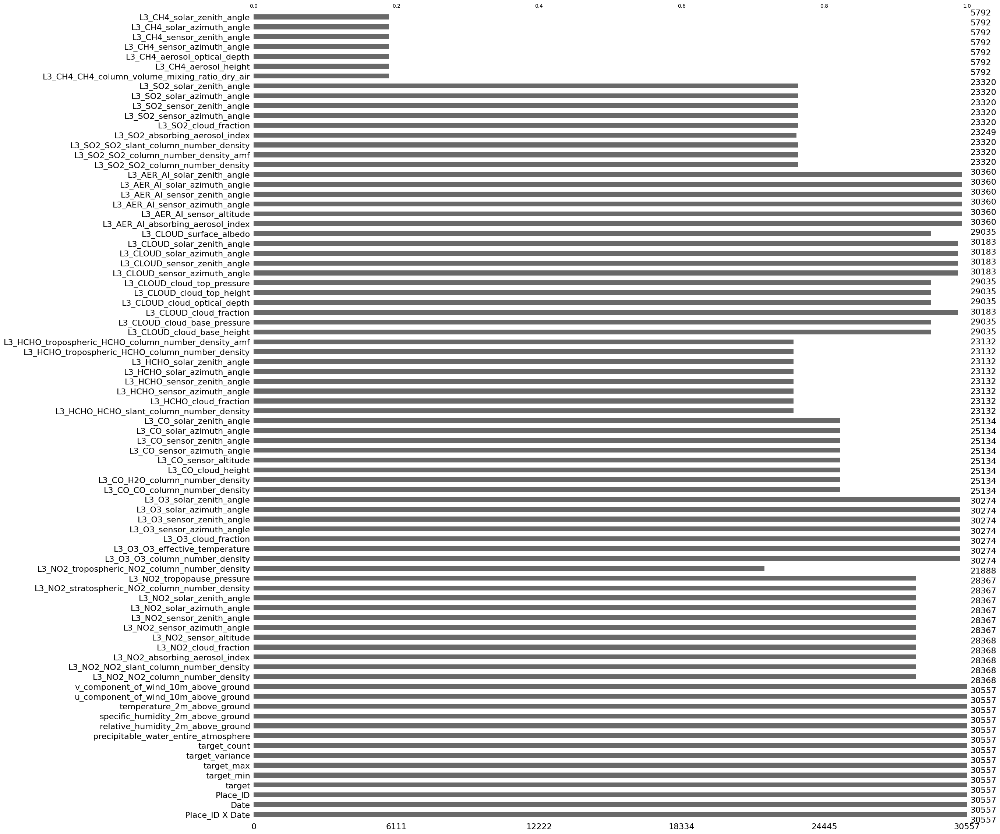

In [ ]:
msno.bar(df)

In [ ]:
df.describe()



,target,target_min,target_max,target_variance,target_count,precipitable_water_entire_atmosphere,relative_humidity_2m_above_ground,specific_humidity_2m_above_ground,temperature_2m_above_ground,u_component_of_wind_10m_above_ground,...,L3_SO2_sensor_zenith_angle,L3_SO2_solar_azimuth_angle,L3_SO2_solar_zenith_angle,L3_CH4_CH4_column_volume_mixing_ratio_dry_air,L3_CH4_aerosol_height,L3_CH4_aerosol_optical_depth,L3_CH4_sensor_azimuth_angle,L3_CH4_sensor_zenith_angle,L3_CH4_solar_azimuth_angle,L3_CH4_solar_zenith_angle
count,30557.000000,30557.000000,30557.000000,3.055700e+04,30557.000000,30557.000000,30557.000000,30557.000000,30557.000000,30557.000000,...,23320.000000,23320.000000,23320.000000,5792.000000,5792.000000,5792.000000,5792.000000,5792.000000,5792.000000,5792.000000
mean,61.148045,29.025866,117.992234,7.983756e+03,125.831135,15.302326,70.552747,0.006004,9.321342,0.416886,...,35.590916,-123.697777,46.533951,923.231949,1711.793613,0.016227,1.254703,13.849040,-69.098594,23.100630
std,46.861309,33.119775,100.417713,4.863090e+04,146.581856,10.688573,18.807884,0.003787,9.343226,2.707990,...,18.955228,71.916036,14.594267,929.633988,1741.299304,0.027016,55.101250,18.004375,84.702355,24.786350
min,1.000000,1.000000,1.000000,0.000000e+00,2.000000,0.420044,5.128572,0.000139,-34.647879,-15.559646,...,0.000000,-179.880630,0.000000,0.000000,0.000000,0.000000,-105.367363,0.000000,-179.947422,0.000000
25%,25.000000,5.000000,60.000000,1.064920e+03,44.000000,7.666667,58.600002,0.003403,3.123071,-1.097864,...,19.451524,-165.882624,36.693094,0.000000,0.000000,0.000000,0.000000,0.000000,-161.726937,0.000000
50%,50.000000,15.000000,91.000000,2.395350e+03,72.000000,12.200000,74.099998,0.004912,8.478424,0.222092,...,37.918838,-156.637162,47.445010,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,80.000000,44.000000,155.000000,5.882550e+03,150.000000,19.900000,85.450001,0.007562,16.201563,1.772925,...,52.270055,-118.453598,57.438181,1861.674119,3393.541633,0.023829,62.245728,27.412303,0.000000,47.090635
max,815.000000,438.000000,999.000000,1.841490e+06,1552.000000,72.599998,100.000000,0.021615,37.437921,17.955124,...,66.111289,179.776125,79.631711,2112.522949,6478.550544,0.210483,77.355232,59.972710,179.813344,69.992363


In [ ]:
df_filtered = df.loc[:, ~((df.columns.str.startswith('L3')) & (~df.columns.str.contains('column_number_density')))]

In [ ]:
df_filtered.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30557 entries, 0 to 30556
Data columns (total 27 columns):
 #   Column                                               Non-Null Count  Dtype  
---  ------                                               --------------  -----  
 0   Place_ID X Date                                      30557 non-null  object 
 1   Date                                                 30557 non-null  object 
 2   Place_ID                                             30557 non-null  object 
 3   target                                               30557 non-null  float64
 4   target_min                                           30557 non-null  float64
 5   target_max                                           30557 non-null  float64
 6   target_variance                                      30557 non-null  float64
 7   target_count                                         30557 non-null  int64  
 8   precipitable_water_entire_atmosphere                 30557 non-nul

In [ ]:
type(df['Date'])
#->Change to np datetime

pandas.core.series.Series

In [ ]:
def filter_cols(df):

    keep_cols = ['L3_CLOUD_cloud_fraction', 
                 'L3_CLOUD_cloud_base_height', 
                 'L3_CLOUD_cloud_optical_depth', 
                 'L3_AER_AI_absorbing_aerosol_index']

    mask = (
        (df.columns.str.startswith('L3')) & 
        (~df.columns.str.contains('column_number_density')) |
        df.columns.str.contains('slant|stratospheric|amf'))

    return df.loc[:, ~mask | df.columns.isin(keep_cols)]


In [ ]:
df_filtered = filter_cols(df)

In [ ]:
df_filtered.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30557 entries, 0 to 30556
Data columns (total 25 columns):
 #   Column                                           Non-Null Count  Dtype  
---  ------                                           --------------  -----  
 0   Place_ID X Date                                  30557 non-null  object 
 1   Date                                             30557 non-null  object 
 2   Place_ID                                         30557 non-null  object 
 3   target                                           30557 non-null  float64
 4   target_min                                       30557 non-null  float64
 5   target_max                                       30557 non-null  float64
 6   target_variance                                  30557 non-null  float64
 7   target_count                                     30557 non-null  int64  
 8   precipitable_water_entire_atmosphere             30557 non-null  float64
 9   relative_humidity_2m_above_g

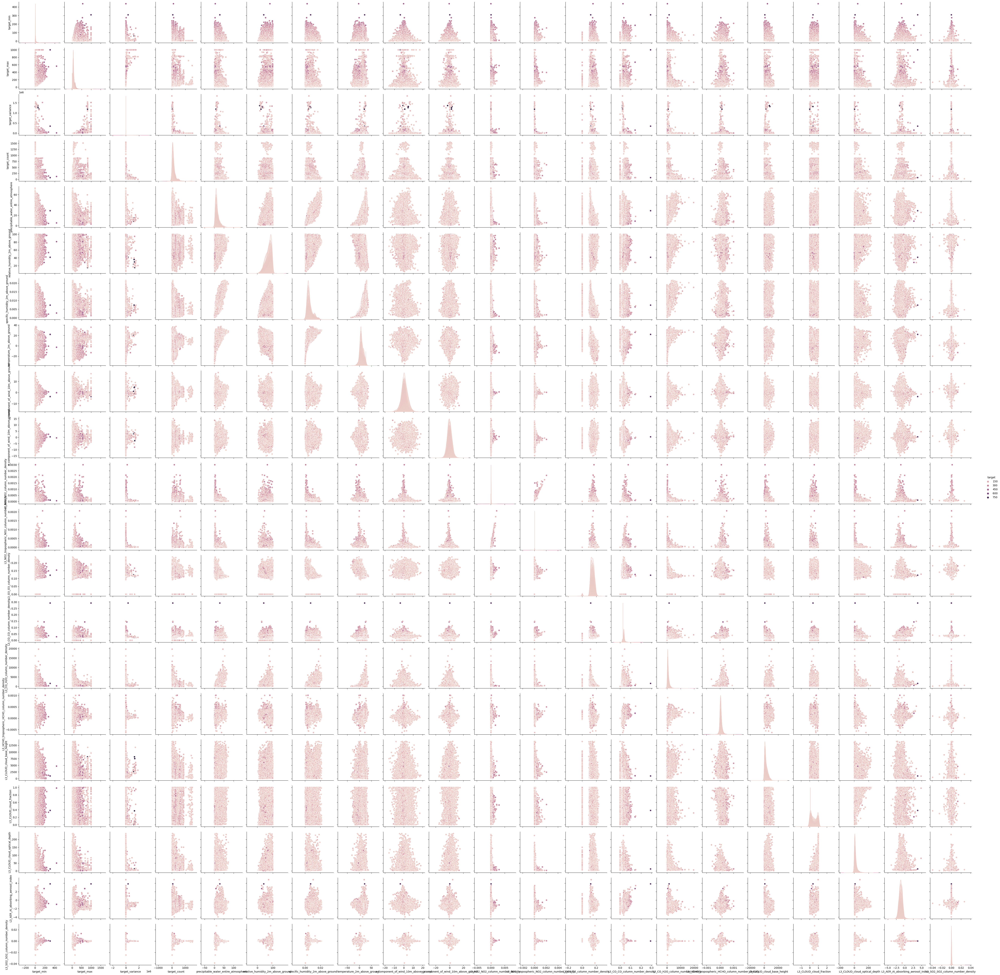

In [ ]:
sns.pairplot(df_filtered,hue='target')

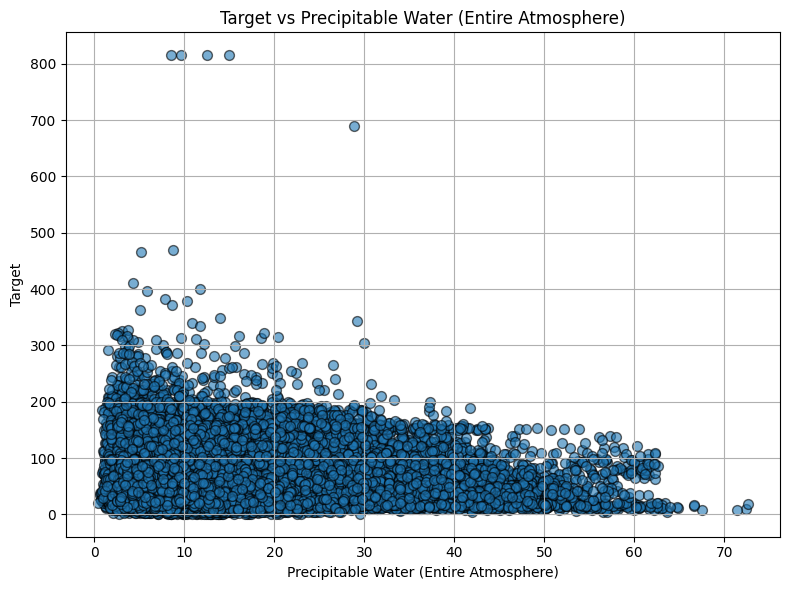

In [ ]:
plt.figure(figsize=(8,6))  

plt.scatter(
    df_filtered["precipitable_water_entire_atmosphere"],
    df_filtered["target"],
    alpha=0.6,  # make points slightly transparent for dense data
    edgecolor='k', # black edge around points
    s=50          # size of points
)

plt.xlabel("Precipitable Water (Entire Atmosphere)")
plt.ylabel("Target")
plt.title("Target vs Precipitable Water (Entire Atmosphere)")
plt.grid(True)  # add grid for readability
plt.tight_layout()  # better layout
plt.show()

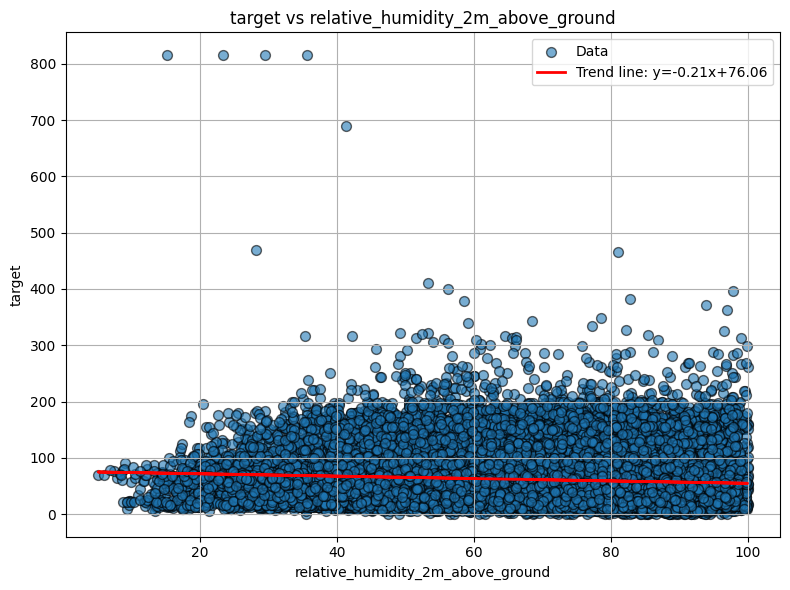

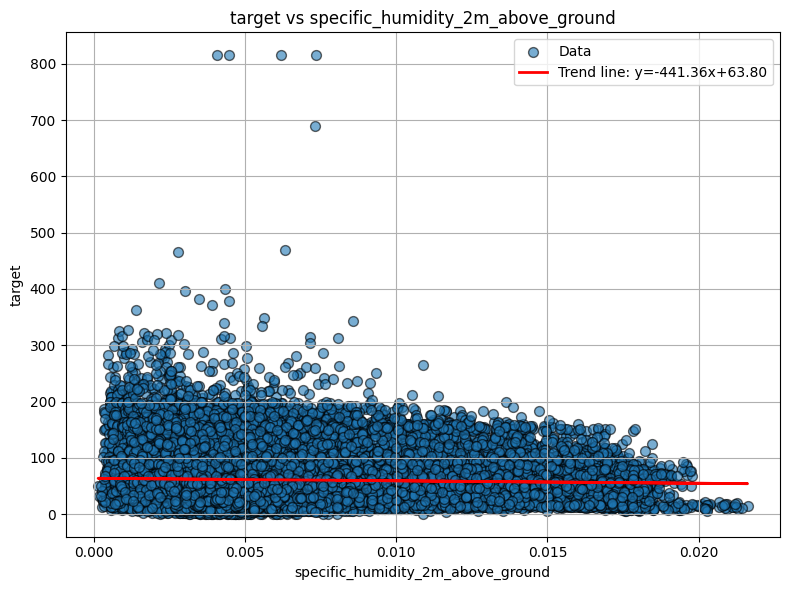

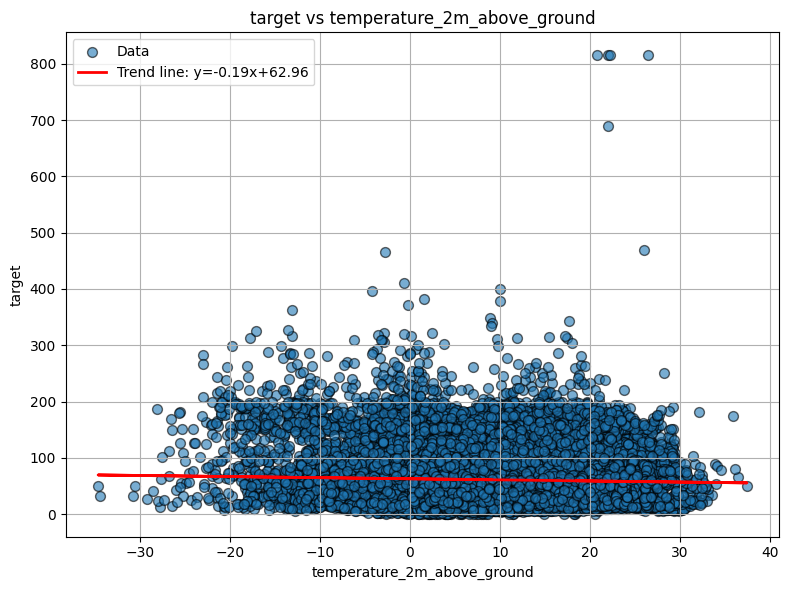

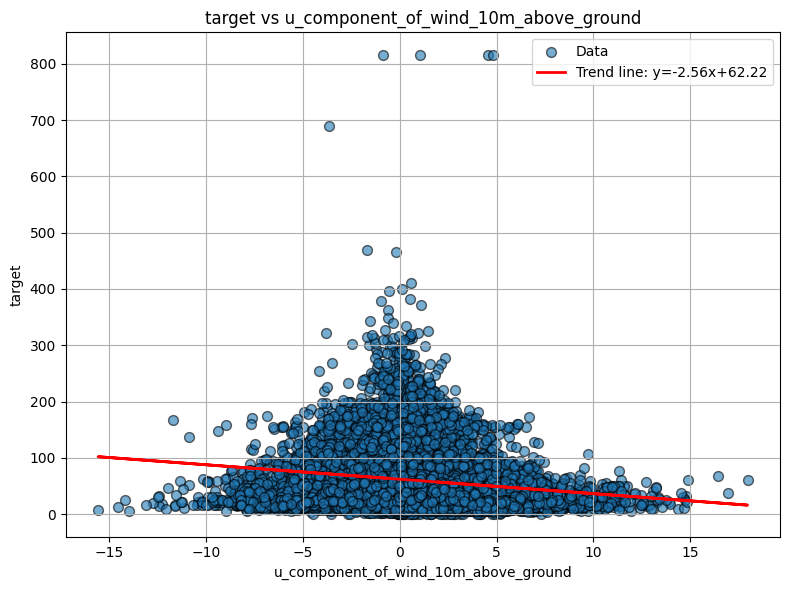

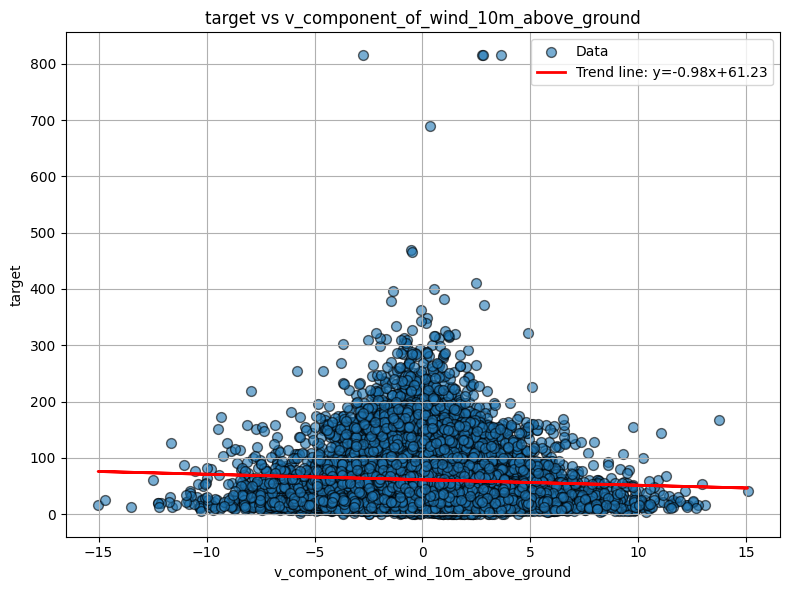

 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value
 ** On entry to DLASCL parameter number  5 had an illegal value
 ** On entry to DLASCL parameter number  4 had an illegal value


LinAlgError: SVD did not converge in Linear Least Squares

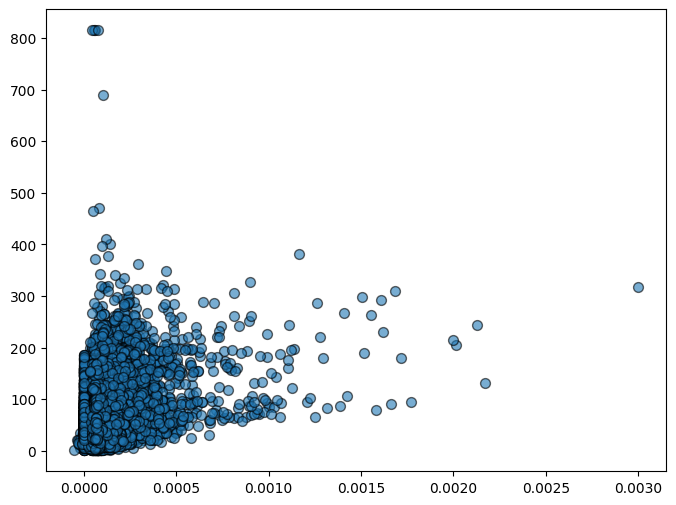

In [ ]:

def scatter_plots_with_trend(df, target_col, start_idx, end_idx):
    """
    Creates scatter plots of target_col vs columns from start_idx to end_idx,
    with a linear regression trend line.
    
    Parameters:
        df (pd.DataFrame): Your DataFrame
        target_col (str): Name of the target column
        start_idx (int): Starting column index (inclusive)
        end_idx (int): Ending column index (inclusive)
    """
    for col in df.columns[start_idx:end_idx + 1]:
        x = df[col]
        y = df[target_col]
        
        plt.figure(figsize=(8,6))
        plt.scatter(x, y, alpha=0.6, edgecolor='k', s=50, label='Data')
        
        # Fit linear regression line
        m, b = np.polyfit(x, y, 1)
        plt.plot(x, m*x + b, color='red', linewidth=2, label=f'Trend line: y={m:.2f}x+{b:.2f}')
        
        plt.xlabel(col)
        plt.ylabel(target_col)
        plt.title(f"{target_col} vs {col}")
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()

# Example usage:
scatter_plots_with_trend(df_filtered, target_col="target", start_idx=9, end_idx=25)

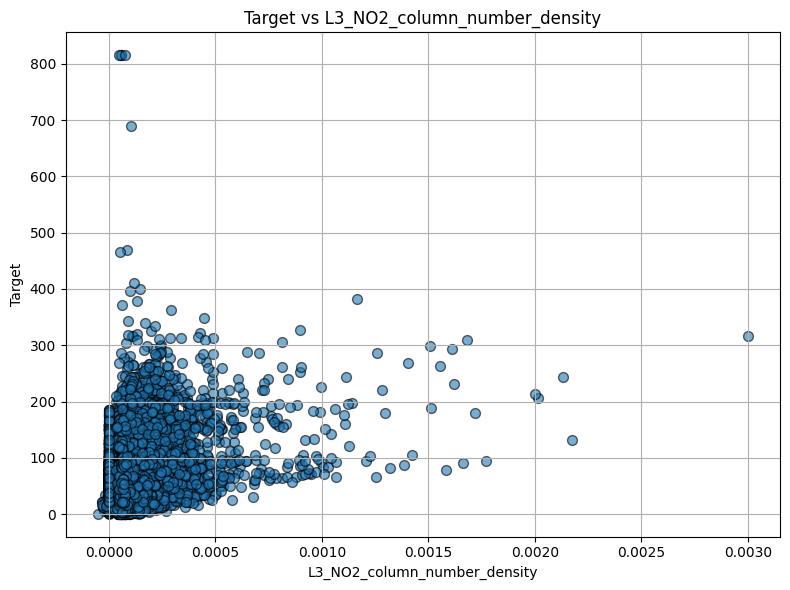

In [ ]:
plt.figure(figsize=(8,6))  

plt.scatter(
    df_filtered["L3_NO2_NO2_column_number_density"],
    df_filtered["target"],
    alpha=0.6,  # make points slightly transparent for dense data
    edgecolor='k', # black edge around points
    s=50          # size of points
)

plt.xlabel("L3_NO2_column_number_density")
plt.ylabel("Target")
plt.title("Target vs L3_NO2_column_number_density")
plt.grid(True)  # add grid for readability
plt.tight_layout()  # better layout
plt.show()

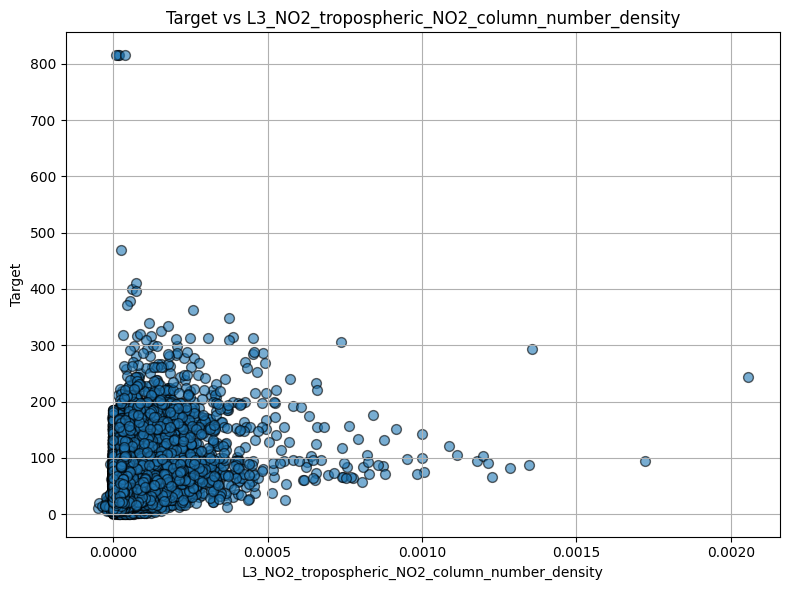

In [ ]:
plt.figure(figsize=(8,6))  

plt.scatter(
    df_filtered["L3_NO2_tropospheric_NO2_column_number_density"],
    df_filtered["target"],
    alpha=0.6,  # make points slightly transparent for dense data
    edgecolor='k', # black edge around points
    s=50          # size of points
)

plt.xlabel("L3_NO2_tropospheric_NO2_column_number_density")
plt.ylabel("Target")
plt.title("Target vs L3_NO2_tropospheric_NO2_column_number_density")
plt.grid(True)  # add grid for readability
plt.tight_layout()  # better layout
plt.show()

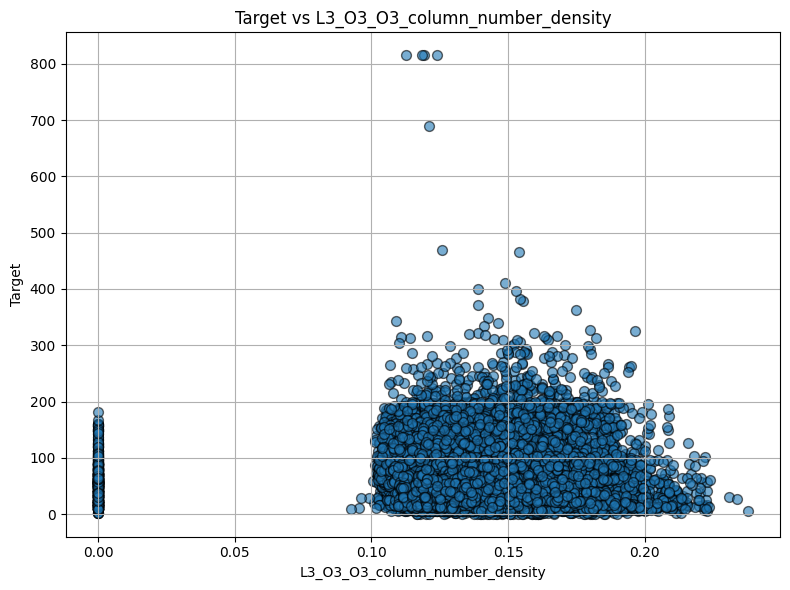

In [ ]:
plt.figure(figsize=(8,6))  

plt.scatter(
    df_filtered["L3_O3_O3_column_number_density"],
    df_filtered["target"],
    alpha=0.6,  # make points slightly transparent for dense data
    edgecolor='k', # black edge around points
    s=50          # size of points
)

plt.xlabel("L3_O3_O3_column_number_density")
plt.ylabel("Target")
plt.title("Target vs L3_O3_O3_column_number_density")
plt.grid(True)  # add grid for readability
plt.tight_layout()  # better layout
plt.show()

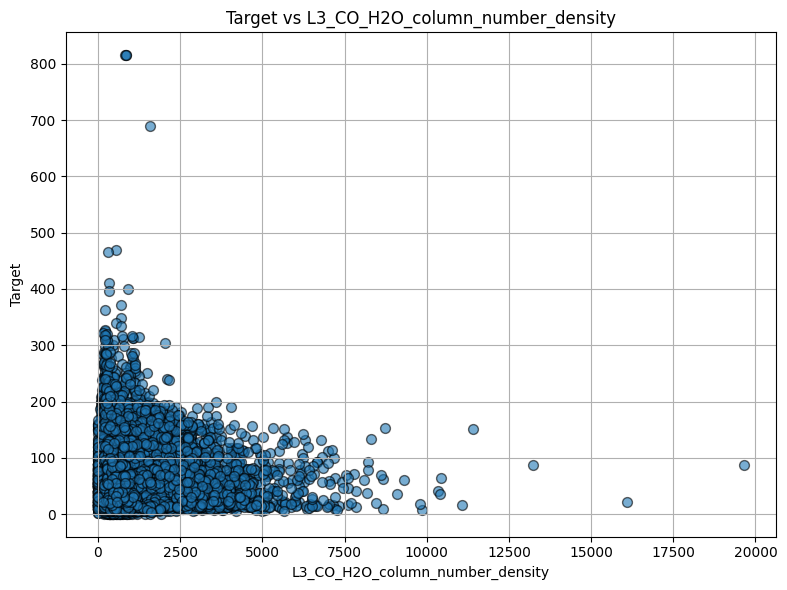

In [ ]:
plt.figure(figsize=(8,6))  

plt.scatter(
    df_filtered["L3_CO_H2O_column_number_density"],
    df_filtered["target"],
    alpha=0.6,  # make points slightly transparent for dense data
    edgecolor='k', # black edge around points
    s=50          # size of points
)

plt.xlabel("L3_CO_H2O_column_number_density")
plt.ylabel("Target")
plt.title("Target vs L3_CO_H2O_column_number_density")
plt.grid(True)  # add grid for readability
plt.tight_layout()  # better layout
plt.show()

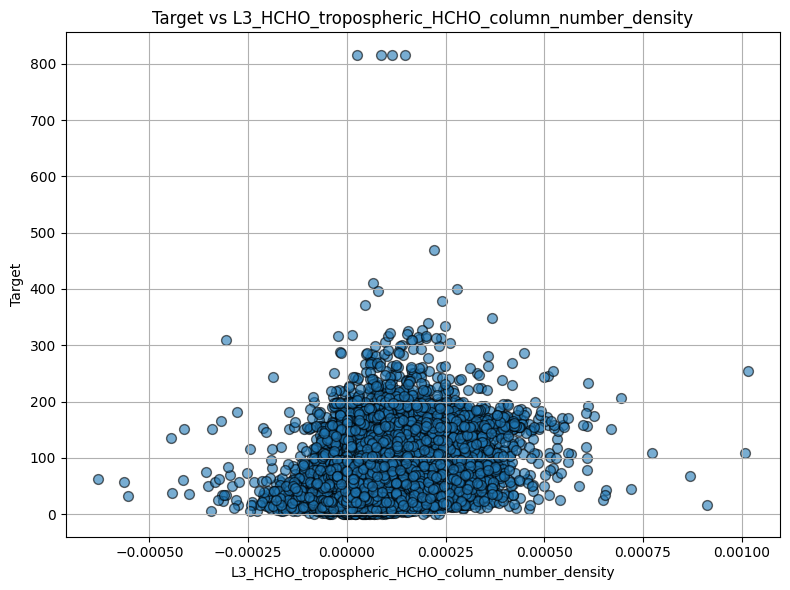

In [ ]:
plt.figure(figsize=(8,6))  

plt.scatter(
    df_filtered["L3_HCHO_tropospheric_HCHO_column_number_density"],
    df_filtered["target"],
    alpha=0.6,  # make points slightly transparent for dense data
    edgecolor='k', # black edge around points
    s=50          # size of points
)

plt.xlabel("L3_HCHO_tropospheric_HCHO_column_number_density")
plt.ylabel("Target")
plt.title("Target vs L3_HCHO_tropospheric_HCHO_column_number_density")
plt.grid(True)  # add grid for readability
plt.tight_layout()  # better layout
plt.show()

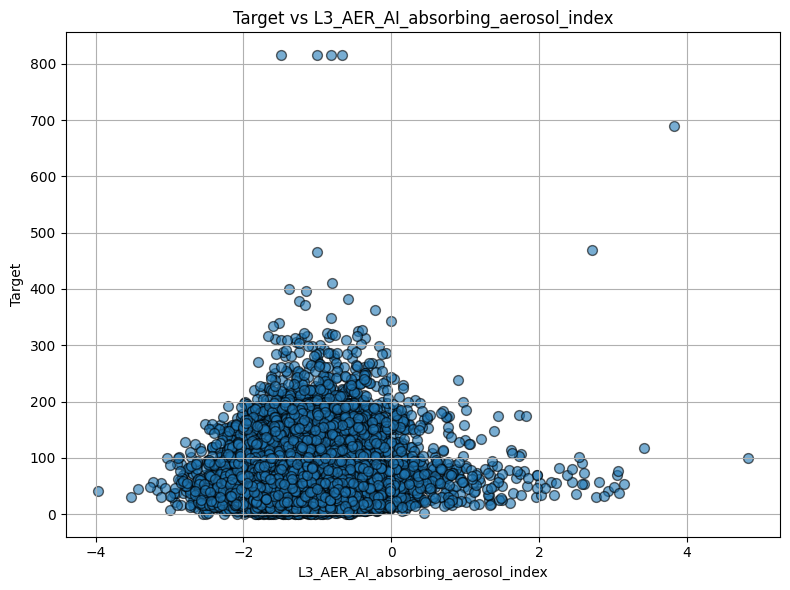

In [ ]:
plt.figure(figsize=(8,6))  

plt.scatter(
    df_filtered["L3_AER_AI_absorbing_aerosol_index"],
    df_filtered["target"],
    alpha=0.6,  # make points slightly transparent for dense data
    edgecolor='k', # black edge around points
    s=50          # size of points
)

plt.xlabel("L3_AER_AI_absorbing_aerosol_index")
plt.ylabel("Target")
plt.title("Target vs L3_AER_AI_absorbing_aerosol_index")
plt.grid(True)  # add grid for readability
plt.tight_layout()  # better layout
plt.show()

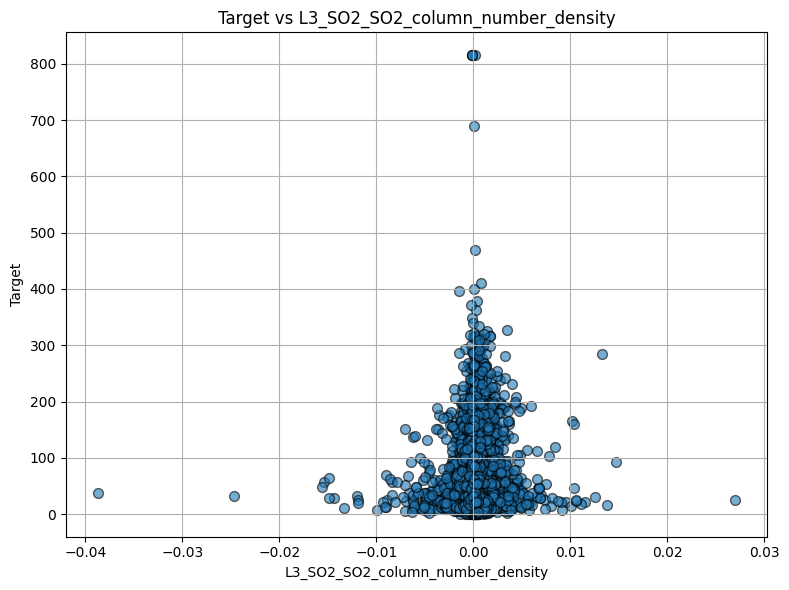

In [ ]:
plt.figure(figsize=(8,6))  

plt.scatter(
    df_filtered["L3_SO2_SO2_column_number_density"],
    df_filtered["target"],
    alpha=0.6,  # make points slightly transparent for dense data
    edgecolor='k', # black edge around points
    s=50          # size of points
)

plt.xlabel("L3_SO2_SO2_column_number_density")
plt.ylabel("Target")
plt.title("Target vs L3_SO2_SO2_column_number_density")
plt.grid(True)  # add grid for readability
plt.tight_layout()  # better layout
plt.show()

In [ ]:
#-> remove outliers below 

In [ ]:
plt.figure(figsize=(8,6))  

plt.scatter(
    df_filtered["L3_NO2_NO2_column_number_density"],
    df_filtered["target"],
    alpha=0.6,  # make points slightly transparent for dense data
    edgecolor='k', # black edge around points
    s=50          # size of points
)

plt.xlabel("L3_NO2_NO2_column_number_density")
plt.ylabel("Target")
plt.title("Target vs L3_NO2_NO2_column_number_density")
plt.grid(True)  # add grid for readability
plt.tight_layout()  # better layout
plt.show()

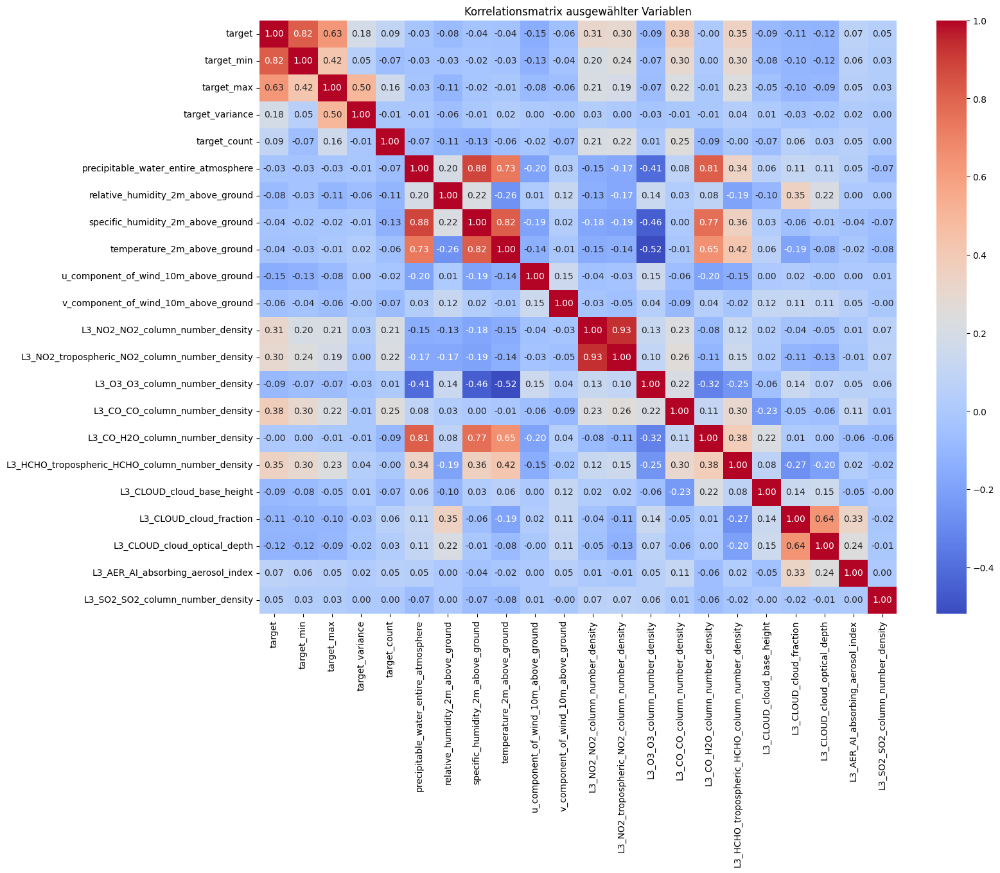

In [ ]:
# Plot correlation matrix   
corr = df_filtered.corr(numeric_only=True)
plt.figure(figsize=(16,12))
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Korrelationsmatrix ausgewählter Variablen")
plt.show()

# Data Cleaning

Ideas:

 
- Ouliers are for vertical columns lower than -0.001 mol/m^2. (Based on suggestions in the satellite dataset)
Potentially check high cloud cover


In [ ]:
#Duplicates check

df_filtered.duplicated().value_counts()

False    30557
Name: count, dtype: int64

In [ ]:
df["Date"] = pd.to_datetime(df["Date"], format="%Y-%m-%d")


### Check and remove Outliers

### Detect Skewness and distribution
.describe()
(Boxplot)

Summary

In [ ]:
### Check Null Values